In [4]:
MB05_names = ["Art", "Books", "Dolls", "Laundry", "Moebius", "Reindeer"]
MB05_name = MB05_names[  0  ]  # choose 0 to 5
MB05_scales = [("FullSize", 1.0), ("HalfSize", 2.0), ("ThirdSize", 3.0)]
MB05_scale = MB05_scales[2]  # choose 0 to 2
zipURL = "http://vision.middlebury.edu/stereo/data/scenes2005/" + MB05_scale[0] + "/zip-2views/" + MB05_name +"-2views.zip"

print("Downloading the dataset " + MB05_name + " (" + MB05_scale[0] + ") ..")
!wget $zipURL --no-check-certificate --show-progress -q -O "/tmp/tmp.zip"

/tmp/tmp.zip        100%[===================>] 577.72K   375KB/s    in 1.5s    


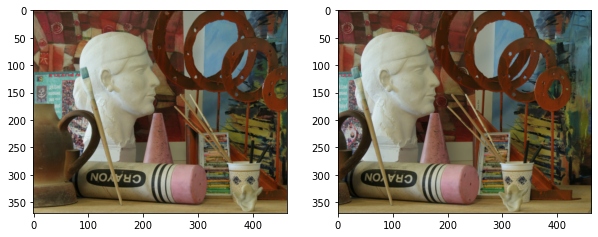

In [32]:
import zipfile
import os

with zipfile.ZipFile("/tmp/tmp.zip", 'r') as f:
    f.extractall("/tmp")

import numpy
from PIL import Image

root_dir = "/tmp/" + MB05_name
left = numpy.asarray(Image.open(root_dir + '/view1.png'))
right = numpy.asarray(Image.open(root_dir + '/view5.png'))
disp1 = numpy.asarray(Image.open(root_dir + '/disp1.png')) / MB05_scale[1]
height, width, colors = left.shape
with open(root_dir + '/dmin.txt', 'r') as f:
    doffs = int(f.read()) / MB05_scale[1]
disp1 = disp1 + doffs

%matplotlib inline
import matplotlib.pyplot as plt
plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.imshow(left)
plt.subplot(1,2,2)
plt.imshow(right)
# plt.subplot(1,3,3)
# plt.imshow(disp1, cmap="gray")

In [58]:
import numpy as np
# 画像の中心を主点と仮定します．
cx, cy = width*0.5, height*0.5
# j_to_u = lambda j: -(j - cx)
# i_to_v = lambda i: -(i - cy)
j_to_u = lambda j: -(j - cx) * MB05_scale[1]
i_to_v = lambda i: -(i - cy) * MB05_scale[1]
u, v = np.meshgrid(j_to_u(np.arange(width)), i_to_v(np.arange(height)))
print(u, u.shape)
print(v, v.shape)

[[ 694.5  691.5  688.5 ... -685.5 -688.5 -691.5]
 [ 694.5  691.5  688.5 ... -685.5 -688.5 -691.5]
 [ 694.5  691.5  688.5 ... -685.5 -688.5 -691.5]
 ...
 [ 694.5  691.5  688.5 ... -685.5 -688.5 -691.5]
 [ 694.5  691.5  688.5 ... -685.5 -688.5 -691.5]
 [ 694.5  691.5  688.5 ... -685.5 -688.5 -691.5]] (370, 463)
[[ 555.  555.  555. ...  555.  555.  555.]
 [ 552.  552.  552. ...  552.  552.  552.]
 [ 549.  549.  549. ...  549.  549.  549.]
 ...
 [-546. -546. -546. ... -546. -546. -546.]
 [-549. -549. -549. ... -549. -549. -549.]
 [-552. -552. -552. ... -552. -552. -552.]] (370, 463)


In [34]:
import tkinter
import tkinter.ttk
import PIL
from PIL import ImageTk
from PIL import Image, ImageDraw
from PIL import ImageFont, ImageDraw, Image

def find_font_size(text, font, image, target_width_ratio):
    tested_font_size = 100
    tested_font = ImageFont.truetype(font, tested_font_size)
    observed_width, observed_height = get_text_size(text, image, tested_font)
    estimated_font_size = tested_font_size / (observed_width / image.width) * target_width_ratio
    return round(estimated_font_size)

class Application(tkinter.Frame):
    def __init__(self, left, right, width, height, master=None):
        super().__init__(master)
        self.master = master
        self.master.title('視差を測ってみよう')
        self.pack()
        self.create_widgets(width, height)
        self.set_image(left)
        self.set_image_right(right)
        self.original_image = left.copy()
        self.image_left = Image.fromarray(self.original_image.copy())
        self.image_left_draw = ImageDraw.Draw(self.image_left)
        
        self.original_image_right = right.copy()
        self.image_right = Image.fromarray(self.original_image_right.copy())
        self.image_right_draw = ImageDraw.Draw(self.image_left)

    def create_widgets(self,width, height):
        self.start_x = tkinter.StringVar()
        self.start_y = tkinter.StringVar()
#         self.current_x = tkinter.StringVar()
#         self.current_y = tkinter.StringVar()
#         self.stop_x = tkinter.StringVar()
#         self.stop_y = tkinter.StringVar()

#         self.label_description = tkinter.ttk.Label(self, text='Mouse position')
#         self.label_description.grid(row=0, column=1)
#         self.label_start_x = tkinter.ttk.Label(self, textvariable=self.start_x)
#         self.label_start_x.grid(row=1, column=1)
#         self.label_start_y = tkinter.ttk.Label(self, textvariable=self.start_y)
#         self.label_start_y.grid(row=2, column=1)
#         self.label_current_x = tkinter.ttk.Label(self, textvariable=self.current_x)
#         self.label_current_x.grid(row=3, column=1)
#         self.label_current_y = tkinter.ttk.Label(self, textvariable=self.current_y)
#         self.label_current_y.grid(row=4, column=1)
#         self.label_stop_x = tkinter.ttk.Label(self, textvariable=self.stop_x)
#         self.label_stop_x.grid(row=5, column=1)
#         self.label_stop_y = tkinter.ttk.Label(self, textvariable=self.stop_y)
#         self.label_stop_y.grid(row=6, column=1)

        self.test_canvas = tkinter.Canvas(self, bg='lightblue', width=width, height=height, highlightthickness=0)
        self.test_canvas.grid(row=0, column=0, rowspan=7)
        self.test_canvas.bind('<ButtonPress-1>', self.start_pickup)
        
        self.test_canvas_r = tkinter.Canvas(self, bg='lightblue', width=width, height=height, highlightthickness=0)
        self.test_canvas_r.grid(row=1, column=1)
        self.test_canvas_r.bind('<ButtonPress-1>', self.start_pickup_right)
        
    def paint_img(self,event):
        x, y = event.x, event.y
        u_point = u[event.y, event.x, ]
        v_point = v[event.y, event.x, ]
#         print(u_point, v_point)
        self.image_left_draw.line([(x-5, y), (x+5, y)], fill='red', width=1) 
        self.image_left_draw.line([(x, y-5), (x, y+5)], fill='red', width=1) 
        font = PIL.ImageFont.truetype("~/../../usr/share/fonts/truetype/ubuntu/Ubuntu-BI.ttf")
        w,h = self.image_left_draw.textsize('x:{}, y:{}'.format(x,y), font=font)
        size = 5 / (w / self.test_canvas.winfo_width()) * 0.5
        font = PIL.ImageFont.truetype("~/../../usr/share/fonts/truetype/ubuntu/Ubuntu-BI.ttf", round(size))
        self.image_left_draw.text((x-50, y-30), 'u:{}, v:{}'.format(u_point, v_point), fill='red', align='right', font=font)
        self.test_canvas._image_tk = ImageTk.PhotoImage(self.image_left)
        self.test_canvas.itemconfigure(self.test_canvas._image_id, image=self.test_canvas._image_tk)
        
    def start_pickup(self, event):
        self.start_x.set('x : ' + str(event.x))
        self.start_y.set('y : ' + str(event.y))
        self.paint_img(event)
        
        self.image_left = Image.fromarray(self.original_image.copy())
        self.image_left_draw = ImageDraw.Draw(self.image_left)
        
    def paint_img_r(self,event):
        x, y = event.x, event.y
        u_point = u[event.y, event.x, ] + doffs
        v_point = v[event.y, event.x, ]
        self.image_right_draw.line([(x-5, y), (x+5, y)], fill='red', width=1) 
        self.image_right_draw.line([(x, y-5), (x, y+5)], fill='red', width=1) 
        font = PIL.ImageFont.truetype("~/../../usr/share/fonts/truetype/ubuntu/Ubuntu-BI.ttf")
        w,h = self.image_left_draw.textsize('x:{}, y:{}'.format(x,y), font=font)
        size = 5 / (w / self.test_canvas_r.winfo_width()) * 0.5
        font = PIL.ImageFont.truetype("~/../../usr/share/fonts/truetype/ubuntu/Ubuntu-BI.ttf", round(size))
        self.image_right_draw.text((x-50, y-30), 'u:{:.1f}, v:{:.1f}'.format(u_point, v_point), fill='red', align='right', font=font)
        self.test_canvas_r._image_tk = ImageTk.PhotoImage(self.image_right)
        self.test_canvas_r.itemconfigure(self.test_canvas_r._image_id, image=self.test_canvas_r._image_tk)
        
    def start_pickup_right(self, event):
        self.start_x.set('x : ' + str(event.x))
        self.start_y.set('y : ' + str(event.y))
        self.paint_img_r(event)
        
        self.image_right = Image.fromarray(self.original_image_right.copy())
        self.image_right_draw = ImageDraw.Draw(self.image_right)
        
    def set_image(self, left):
        self.update() # Canvasのサイズを取得するため更新しておく
        canvas_width = self.test_canvas.winfo_width()
        canvas_height = self.test_canvas.winfo_height()
        self.photo_image = ImageTk.PhotoImage(image=Image.fromarray(left), master=self.test_canvas)
        # 画像の描画
        self.test_canvas._image_id = self.test_canvas.create_image(
                canvas_width / 2,       # 画像表示位置(Canvasの中心)
                canvas_height / 2,                   
                image=self.photo_image  # 表示画像データ
                )

    def set_image_right(self, img):
        canvas_width = self.test_canvas_r.winfo_width()
        canvas_height = self.test_canvas_r.winfo_height()
        self.photo_image_r = ImageTk.PhotoImage(image=Image.fromarray(right), master=self.test_canvas_r)
        # 画像の描画
        self.test_canvas_r._image_id = self.test_canvas_r.create_image(
                canvas_width / 2,       # 画像表示位置(Canvasの中心)
                canvas_height / 2,                   
                image=self.photo_image_r  # 表示画像データ
                )
        
root = tkinter.Tk()
app = Application(left, right, width, height, master=root)
app.mainloop()

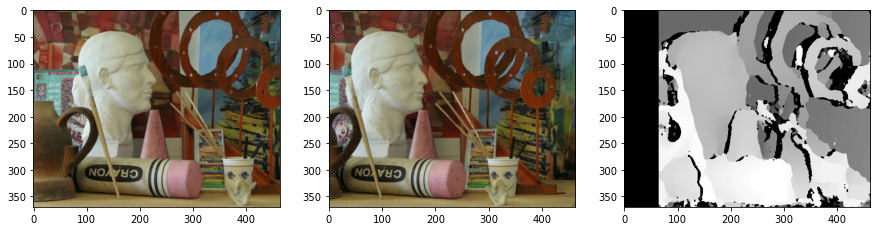

In [128]:
import cv2
disparities = 64
block = 20

# https://docs.opencv.org/4.1.2/dd/d53/tutorial_py_depthmap.html
# sbm = cv2.StereoBM_create(numDisparities=disparities, blockSize=block)

# https://en.wikipedia.org/wiki/Semi-global_matching
# https://core.ac.uk/download/pdf/11134866.pdf
sbm = cv2.StereoSGBM_create(numDisparities=disparities, blockSize=block, minDisparity=1)

cvleft = cv2.cvtColor(left, cv2.COLOR_RGB2GRAY)
cvright = cv2.cvtColor(right, cv2.COLOR_RGB2GRAY)
disparity = sbm.compute(cvleft, cvright) / 16

import matplotlib.pyplot as plt
plt.figure(figsize=(15,4))
plt.subplot(1,3,1)
plt.imshow(left)
plt.subplot(1,3,2)
plt.imshow(right)
plt.subplot(1,3,3)
# plt.title("Estimated")
plt.imshow(disparity, cmap="gray", vmin=0, vmax=disparities)

In [129]:
focal_length = 3740 # 焦点距離 f [pixels]

def Zuv_to_XY(Z, u, v, f=focal_length):
    ### X = ________   # Z, u, v, f から必要なものを使って計算する
    ### Y = ________   # Z, u, v, f から必要なものを使って計算する
    X = Z*u/f
    Y = Z*v/f
    return X, Y

In [130]:
baseline = 160 # 基線長l [mm]
d = disp1 # 視差 d [pixels]
d = disparity
### Z = ________  # baseline, focal_length, d, doffs を使って計算する（for文不要）．
# Z = baseline * focal_length / (disparity[disparity>0])

# Z = np.zeros_like(left[:,:,0])
Z = baseline * focal_length / (d + doffs)

# Z = np.zeros_like(left[:,:,0])
# Z[disparity>0] = baseline * focal_length / (disparity[disparity>0])
# print(disparity.max(),disparity.min(),)
# plt.hist(disparity)
# Z, u, v から X, Y を計算します．
X, Y = Zuv_to_XY(Z, u, v)

In [132]:
nd = np.count_nonzero(d)
n = 70000
p = np.random.choice(nd, min(n,nd), replace=False)
print(p.shape)
print("%d out of %d points are displayed." % (n, nd))

import plotly.graph_objs  as go
trace = go.Scatter3d(x=X[d>0][p], y=Y[d>0][p], z=Z[d>0][p], mode='markers',
                     marker=dict(size=1, 
                                color=['rgb({},{},{})'.format(r,g,b) for r,g,b in zip(left[:,:,0][d>0][p], left[:,:,1][d>0][p], left[:,:,2][d>0][p])],
                                opacity=0.8))

layout = go.Layout(margin=dict(l=0,r=0,b=0,t=0))
fig = go.Figure(data=[trace], layout=layout)
camera = dict(up=dict(x=0, y=0, z=1), center=dict(x=0, y=-0.4, z=0), eye=dict(x=0, y=0.8, z=-2))
fig.update_layout(scene_camera=camera)
fig.show()

(70000,)
70000 out of 131878 points are displayed.
